Here, we show how to save files from figures generated with [HoloViews](https://github.com/ioam/holoviews/). This was thoroughly explained in this [page](https://ioam.github.io/holoviews/Tutorials/Exporting.html).

<!-- TEASER_END -->

In [3]:
import holoviews
%load_ext holoviews.ipython

The holoviews.ipython extension is already loaded. To reload it, use:
  %reload_ext holoviews.ipython


In [4]:
import imagen
fig = imagen.Gaussian()[:]

:Image   [x,y]   (z)
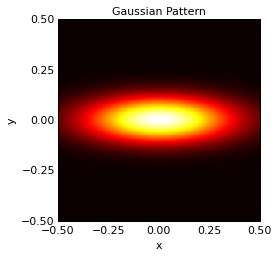

In [5]:
%%output filename="Image-Pattern-Gaussian" fig="png"
imagen.Gaussian()[:]  # Saves Image-Pattern-Gaussian.png

In [6]:
!ls *png

Image-Pattern-Gaussian.png  __temp__.png


In [7]:
%%output filename="Image-Pattern-Gaussian" fig="svg"
fig   # Saves Image-Pattern-Gaussian.svg

:Image   [x,y]   (z)

In [8]:
!ls *.svg

Image-Pattern-Gaussian.svg


:HoloMap   [Default]
   :VectorField   [x,y]   (Angle,Magnitude)
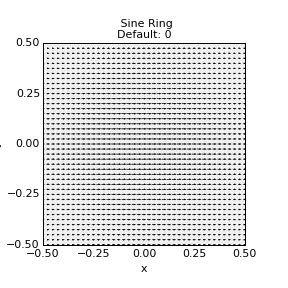

In [9]:
%%output filename="Image-Pattern-Gaussian" holomap="gif"
import numpy as np
from holoviews import HoloMap, VectorField

holomap = HoloMap()
steps = np.linspace(-2.5, 2.5, 41)
x,y = np.meshgrid(steps, steps)
sine_rings  = np.sin(x**2+y**2)*np.pi+np.pi
exp_falloff = 1/np.exp((x**2+y**2)/15)

for deg in np.linspace(0, 360, 128, endpoint=False):
    vector_data = np.array([x.flatten()/5., y.flatten()/5., 
                             np.sin(deg*2*np.pi/360)*sine_rings.flatten(),
                             exp_falloff.flatten()]).T
    holomap[deg] = VectorField(vector_data, group='Sine Ring')
holomap

Another way is to use automatic archiving of the files produced in the notebook.

This is started by issuing the following command:

In [10]:
holoviews.archive.auto()

<IPython.core.display.Javascript object>

Automatic capture is now enabled. [2015-04-27 16:47:36]


And run the whole notebook, every single display will be output appropriately using the chosen naming scheme! This means you can define the filename format you want to use for entire blocks of the notebook.

:Layout
   .Pattern.Gaussian.I  :Image   [x,y]   (z)
   .Pattern.Gaussian.II :Image   [x,y]   (z)
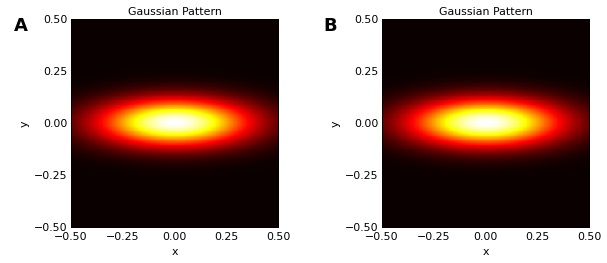

In [11]:
fig + fig

:Layout
   .Pattern.Gaussian :Image   [x,y]   (z)
   .Sine_Ring.I      :HoloMap   [Default]
      :VectorField   [x,y]   (Angle,Magnitude)
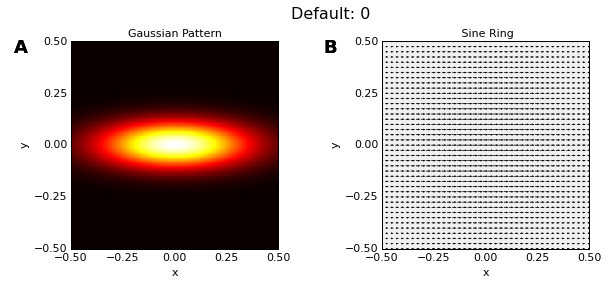
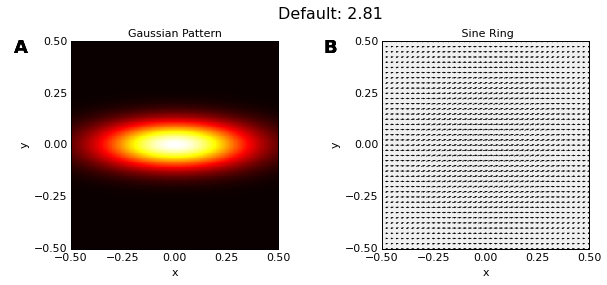
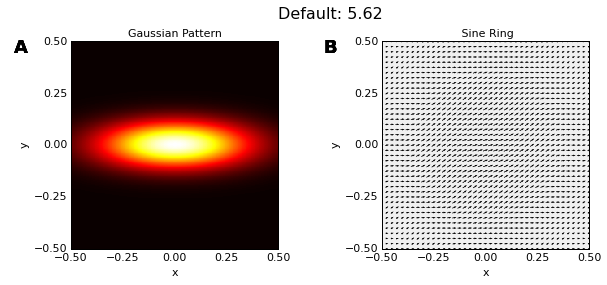
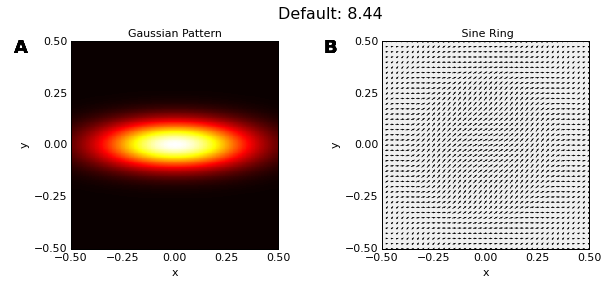
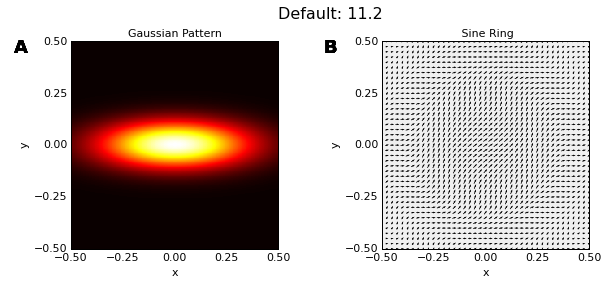
...
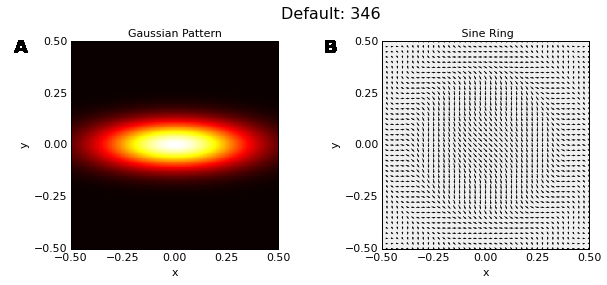
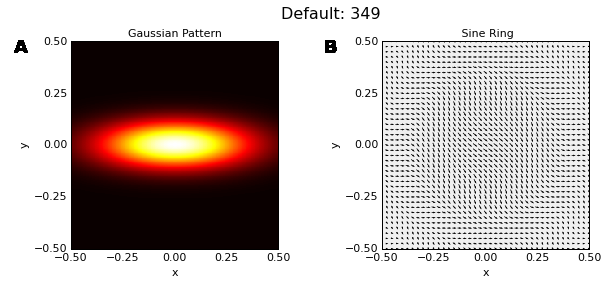
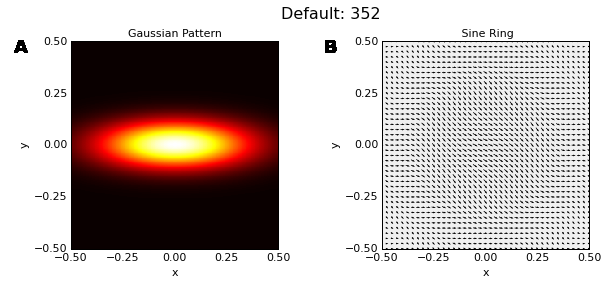
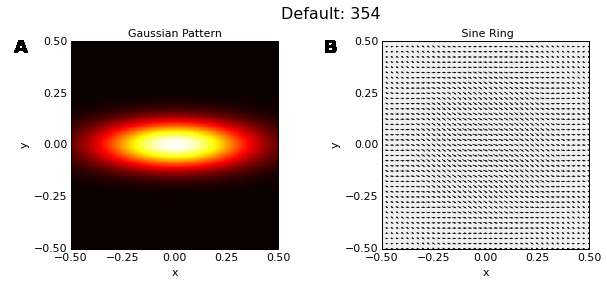
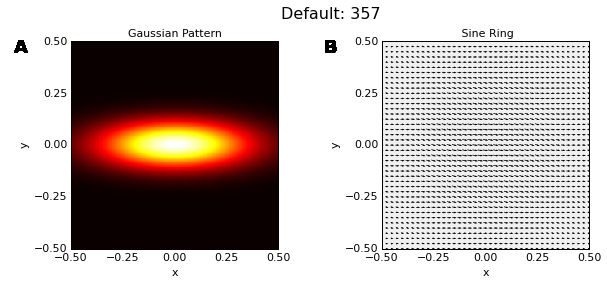

In [12]:
fig + holomap

Note that the file naming is relatively clever: if you already have Image-Pattern-Gaussian.png, it won't overwrite it if a something with a similar name appears - the next one will be named Image-Pattern-Gaussian-1.png etc.


In [13]:
holoviews.archive.contents()

Layout,Pattern-Gaussian.svg           : image/svg+xml
Layout,Pattern-Gaussian.hvz           : application/zip
Layout,Pattern-Gaussian,Sine_Ring.hvz : application/zip


Cleaning up:

In [14]:
!rm *png *.svg